In [ ]:
!nvidia-smi

Fri Mar 12 04:03:00 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


     |████████████████████████████████| 61kB 5.6MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.10-cp37-none-any.whl size=73269 sha256=4a9a10a8e42ac3debfcc67353469d5be4bf397734176d2db6579adc1fc4fc3e2
  Stored in directory: /root/.cache/pip/wheels/3a/d1/7e/6ce09b72b770149802c653a02783821629146983ee5a360f10
Successfully built kaggle
  Found existing installation: kaggle 1.5.10
    Uninstalling kaggle-1.5.10:
      Successfully uninstalled kaggle-1.5.10


In [ ]:
!kaggle datasets download -d sivaprasads/fashion-dataset/

100% 17.1G/17.1G [07:05<00:00, 25.6MB/s]
100% 17.1G/17.1G [07:05<00:00, 43.2MB/s]


In [ ]:
!unzip /content/fashion-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/8e2b5836b55e1c91d9cd2febd1ed4474.jpg  
  inflating: train/8e2c02d4be738dbddabda26906fa5e1c.jpg  
  inflating: train/8e2ddb562182259c3e173cdd4ec15f61.jpg  
  inflating: train/8e2ff8facc28b81d90509d139c67eba5.jpg  
  inflating: train/8e310e15b35fefd066d3e6b016bb3841.jpg  
  inflating: train/8e3380a8ad82bdc45771a8679aec8a70.jpg  
  inflating: train/8e3705c6601f683e485295f28535d8ed.jpg  
  inflating: train/8e384f832dcda47d3e7c3bbc5003eeca.jpg  
  inflating: train/8e39e0a2ec8fc4deb9d6303981f28783.jpg  
  inflating: train/8e3ae5462738dda0db932810165bc55e.jpg  
  inflating: train/8e3e24d56af2d73b589d7177134e1c5e.jpg  
  inflating: train/8e3edda433d68bf6e140c701c3ff64c7.jpg  
  inflating: train/8e42e355c04d42dcf51a0cf87b1abe16.jpg  
  inflating: train/8e4433bbbd2adae0706fdedd9e721d96.jpg  
  inflating: train/8e46b7cc909933cc7e9508c86e08d483.jpg  
  inflating: train/8e4733f2ad786993f70541b99de9d76f.jpg  
  inflating: train/8e

In [ ]:
import os
os.remove('/content/fashion-dataset.zip')

In [ ]:
len(os.listdir('train'))

30097

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
with open('label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]
print(len(label_names),label_names[:5])

46 ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket']


In [ ]:
label_names

['shirt, blouse',
 'top, t-shirt, sweatshirt',
 'sweater',
 'cardigan',
 'jacket',
 'vest',
 'pants',
 'shorts',
 'skirt',
 'coat',
 'dress',
 'jumpsuit',
 'cape',
 'glasses',
 'hat',
 'headband, head covering, hair accessory',
 'tie',
 'glove',
 'watch',
 'belt',
 'leg warmer',
 'tights, stockings',
 'sock',
 'shoe',
 'bag, wallet',
 'scarf',
 'umbrella',
 'hood',
 'collar',
 'lapel',
 'epaulette',
 'sleeve',
 'pocket',
 'neckline',
 'buckle',
 'zipper',
 'applique',
 'bead',
 'bow',
 'flower',
 'fringe',
 'ribbon',
 'rivet',
 'ruffle',
 'sequin',
 'tassel']

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
import numpy as np
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.losses import binary_crossentropy
from tensorflow import reduce_sum

from tensorflow.keras import Model
import random
import warnings
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from keras import backend as K
from skimage.measure import label, regionprops
warnings.filterwarnings('ignore')
import gc
import json

In [ ]:
from google.colab import drive
drive.flush_and_unmount()

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/train.csv')
data['Category'] = data['ClassId'].str.split('_').str[0]
data.shape

(331213, 6)

In [ ]:
data.head(3)

,ImageId,EncodedPixels,Height,Width,ClassId,Category
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,6
1,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,0
2,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,28


In [ ]:
data = data[data['ImageId'].isin(os.listdir('train'))]

In [ ]:
category = [label_names[i] for i in  data.Category.value_counts().reset_index()['index'].astype('int').values]

In [ ]:
analyis = data.Category.value_counts().reset_index()
analyis['name'] = [label_names[i] for i in  data.Category.value_counts().reset_index()['index'].astype('int').values]
analyis

,index,Category,name
0,31,39030,sleeve
1,23,30691,shoe
2,33,22523,neckline
3,32,17846,pocket
4,10,12445,dress
5,1,10819,"top, t-shirt, sweatshirt"
6,6,8284,pants
7,28,6674,collar
8,35,5276,zipper
9,4,5113,jacket


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]),
 <a list of 46 Text major ticklabel objects>)

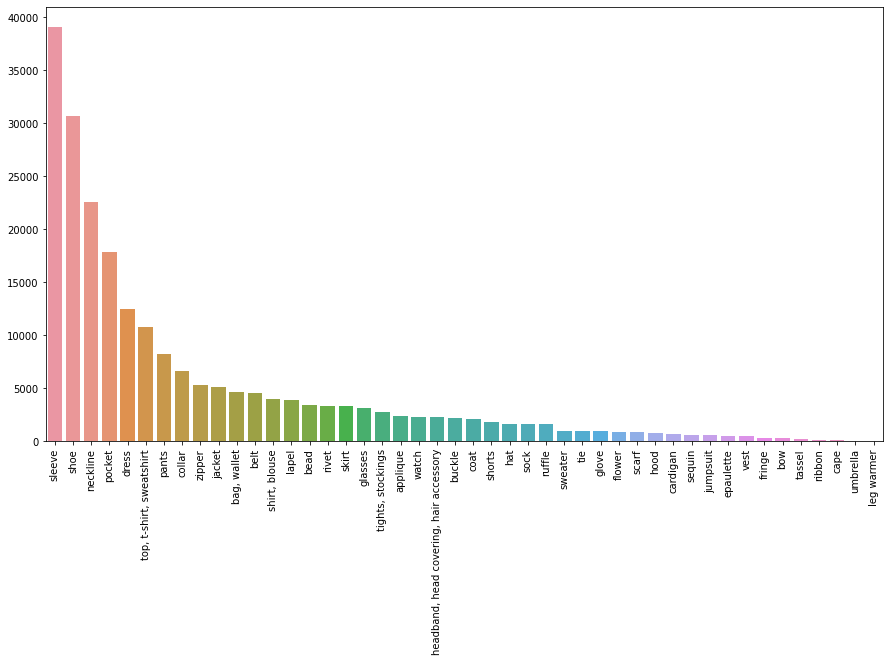

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(category,data.Category.value_counts().values)
plt.xticks(rotation='vertical')

In [ ]:
image_df = data.groupby('ImageId')['EncodedPixels', 'Category'].agg(lambda x: list(x))
size_df = data.groupby('ImageId')['Height', 'Width'].mean()
image_df = image_df.join(size_df, on='ImageId')
image_df.reset_index(inplace=True)
print("Total images: ", len(image_df))
image_df.head()

Total images:  30444


,ImageId,EncodedPixels,Category,Height,Width
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214,3676
1,0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448,2448
2,0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000,1997
3,0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567,400
4,0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750,500


In [ ]:
del image_df

## Train_test_split methods

In [ ]:

#https://www.kaggle.com/vladimirsydor/train-unet-mobilenet
def create_one_represent_class(df_param):
    v_c_df = df_param['CategoryId'].value_counts().reset_index()
    one_represent = v_c_df.loc[v_c_df['CategoryId'] == 1, 'index'].tolist()
    df_param.loc[df_param['CategoryId'].isin(one_represent), 'CategoryId'] = 'one_represent'
    return df_param

def custom_train_test_split(df_param):
    
    df_param['CategoryId'] = df_param.ClassId.apply(lambda x: str(x).split("_")[0])
    
    img_categ = df_param.groupby('ImageId')['CategoryId'].apply(list).reset_index()
    img_categ['CategoryId'] = img_categ['CategoryId'].apply(lambda x: ' '.join(sorted(x)))
    
    img_categ = create_one_represent_class(img_categ)
    
    img_train, img_val  = train_test_split(img_categ, test_size=0.2, random_state=42, stratify=img_categ['CategoryId'])
    
    df_param = df_param.drop(columns='CategoryId')
    
    df_train = df_param[df_param['ImageId'].isin(img_train['ImageId'])].reset_index(drop=True)
    df_val = df_param[df_param['ImageId'].isin(img_val['ImageId'])].reset_index(drop=True)
    
    return df_train, df_val
train, val = custom_train_test_split(data)

In [ ]:

train['Category'] = train['ClassId'].str.split('_').str[0]
print(train.shape)
train_df = train.groupby('ImageId')['EncodedPixels', 'Category'].agg(lambda x: list(x))
size_df = train.groupby('ImageId')['Height', 'Width'].mean()
train_df = train_df.join(size_df, on='ImageId')

print("Total images: ", len(train_df))
print("Shape of train : {}".format(train_df.shape))
train_df.reset_index(inplace=True)
train_df.head()

(176159, 6)
Total images:  24077
Shape of train : (24077, 4)


,ImageId,EncodedPixels,Category,Height,Width
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214,3676
1,0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448,2448
2,0006ea84499fd9a06fefbdf47a5eb4c0.jpg,[73327 6 74328 18 75330 37 76335 63 77340 88 7...,"[1, 33, 8, 23, 23]",1000,667
3,000aac3870ea7c59ca0333ffa5327323.jpg,[8971124 17 8975101 49 8979077 82 8983053 116 ...,"[10, 33, 3, 31, 31, 33]",4000,6000
4,000b3a87508b0fa185fbd53ecbe2e4c6.jpg,[291578 3 292856 8 294133 13 295410 19 296687 ...,"[10, 33, 24]",1280,852


In [ ]:
val['Category'] = val['ClassId'].str.split('_').str[0]
print(val.shape)
val_df = val.groupby('ImageId')['EncodedPixels', 'Category'].agg(lambda x: list(x))
size_df = val.groupby('ImageId')['Height', 'Width'].mean()
val_df = val_df.join(size_df, on='ImageId')

print("Total images: ", len(val_df))
print("Shape of val : {}".format(val_df.shape))
val_df.reset_index(inplace=True)
val_df.head()

(43587, 6)
Total images:  6020
Shape of val : (6020, 4)


,ImageId,EncodedPixels,Category,Height,Width
0,0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000,1997
1,0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567,400
2,0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750,500
3,00048c3a2fb9c29340473c4cfc06424a.jpg,[239016 3 239989 6 240963 7 241938 8 242913 9 ...,"[13, 1, 33, 8, 35, 24, 23, 23]",975,650
4,000775b6b5e27b011dc8bba2d7b85211.jpg,[426259 9 427858 12 429457 14 431056 17 432655...,"[33, 1, 19, 6, 31, 31]",1600,1067


In [ ]:
##https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07
def load_mask(image_id):
    
    mask = np.zeros((512, 512, len(image_df['EncodedPixels'][image_id])), dtype=np.float32)
    labels = []
    for m, (annotation, label) in enumerate(zip(image_df['EncodedPixels'][image_id], image_df['Category'][image_id])):
        sub_mask = np.full(int(image_df['Height'][image_id])*int(image_df['Width'][image_id]), 0, dtype=np.float32)
        annotation = [int(x) for x in annotation.split(' ')]
            
        for i, start_pixel in enumerate(annotation[::2]):
            sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

        sub_mask = sub_mask.reshape((int(image_df['Height'][image_id]), int(image_df['Width'][image_id])), order='F')
    
        sub_mask = cv2.resize(sub_mask, (512, 512), interpolation=cv2.INTER_NEAREST)
        mask[:, :, m] = sub_mask
        labels.append(int(label))
    return mask,labels

In [ ]:
#https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly
#https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07
class Dataset(tf.keras.utils.Sequence):
    """Helper to iterate over the data (as Numpy arrays) 
    Input :batch_size ,data
    data : dataframe with Image path, Encoding_pixels, Category,Height,Width
    output : For evry image the ouput will be in the format of 512*512*46
    
    """
    
    def __init__(self, batch_size,data,shuffle=True):
        self.batch_size = batch_size
        self.image_path = data.ImageId.tolist()
        self.EncodedPixels = data.EncodedPixels.tolist()
        self.Category   = data.Category.tolist()
        self.Height     = data.Height.tolist()
        self.Width      = data.Width.tolist()
        self.shuffle    = shuffle
        self.indexes = np.arange(len(data))
        self.data     = data

    def __len__(self):
        return len(self.image_path) // self.batch_size


    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.image_path))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # Generate data
        X, y = self.__data_generation(indexes)

        return X, y
    def __load_mask(self,EncodedPixels,category,Height,Width):
        mask = np.zeros((512, 512, 47), dtype=np.float32)
        labels = []
        for (annotation, label) in zip(EncodedPixels,category):
            sub_mask = np.full(int(Height)*int(Width), 0, dtype=np.int8)
            annotation = [int(x) for x in annotation.split(' ')]
            
            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape(int(Height), int(Width), order='F')
    
            sub_mask = cv2.resize(sub_mask, (512, 512), interpolation=cv2.INTER_NEAREST)
            mask[:, :, int(label)] = sub_mask
            labels.append(int(label))
        return mask,labels
        
    def __data_generation(self, list_IDs_temp): 
        """Returns tuple (input, target) correspond to batch #idx."""
        ''' we have 46 classed, One image may contain multiple 
        classes so i have created a 512*512*46 i will fill the 
        corresponding vaues with corresponding channel '''   
        #batch_input_img_paths = self.image_path[i : i + self.batch_size]
        batch_input_img_paths  = list_IDs_temp
        #batch_target_img_paths = self.EncodedPixels[i : i + self.batch_size]
        x = np.zeros((self.batch_size,512,512,3), dtype="uint")
        y = np.zeros((self.batch_size,512,512,47), dtype="float32")
        for j, index in enumerate(batch_input_img_paths):
            
            path = self.data.iloc[index,0]
            encoded_pixel = self.data.iloc[index,1]
            category = self.data.iloc[index,2]
            Height = self.data.iloc[index,3]    
            Width  = self.data.iloc[index,4]
            with open('train/'+path, "rb") as local_file:
              img = local_file.read()

            img = tf.image.decode_jpeg(img,channels=3)
            ## Initially it wil be BGR format so we will convert to RGB 
            img = tf.image.resize(img, [512, 512],method='nearest')
            x[j] = img
            mask,label = self.__load_mask(encoded_pixel,category,Height,Width)
            y[j] = mask
        return x, y

In [ ]:
train_data = Dataset(1,train_df)
valid_data = Dataset(1,val_df)

In [ ]:
train_data[0][0].shape,train_data[0][1].shape

((8, 512, 512, 3), (8, 512, 512, 46))

## Pipeline

In [ ]:
train_df['EncodedPixels'] = train_df['EncodedPixels'].astype('str')
train_df['Category'] = train_df['Category'].astype('str')

val_df['EncodedPixels'] = val_df['EncodedPixels'].astype('str')
val_df['Category'] = val_df['Category'].astype('str')

In [ ]:
#os.remove('train/ac32b7122e67e77ce1b48bbba4d90460.jpg')
i = train_df[train_df['ImageId']=='ac32b7122e67e77ce1b48bbba4d90460.jpg'].index
print(i)
train_df.drop(index=i,inplace=True)
i = val_df[val_df['ImageId']=='ac32b7122e67e77ce1b48bbba4d90460.jpg'].index
print(i)
val_df.drop(i,inplace=True)

Int64Index([], dtype='int64')
Int64Index([6088], dtype='int64')


In [ ]:
def create(image_path,EncodedPixel,Category,Height,Width):
    img =tf.image.decode_jpeg(tf.io.read_file('train/'+image_path.decode("utf-8")), channels=3)
    img = tf.image.resize(img,[512,512],method='nearest')
    mask = np.zeros((512,512,47), dtype=np.float32)
    EncodedPixel = EncodedPixel.decode('utf-8').replace('[','').replace("]",'').replace("'",'').split(',')
    Category = Category.decode('utf-8').replace('[','').replace("]",'').replace("'",'').split(',')
    for pixel,label in zip(EncodedPixel,Category):
      sub_mask = np.full(Height*Width,0, dtype=np.uint8)
      pixel  =  [int(float(x)) for x in pixel.lstrip().split(' ')]
      for i, start_pixel in enumerate(pixel[::2]):
        sub_mask[start_pixel:start_pixel+pixel[2*i+1]]=1

      sub_mask = sub_mask.reshape((Height,Width),order = 'F')
        
      sub_mask = cv2.resize(sub_mask, (512,512), interpolation=cv2.INTER_NEAREST)
      mask[:,:,int(label)] = sub_mask
    return img,mask
def tf_funtion(a,b,c,d,e):
  a,b = tf.numpy_function(create,[a,b,c,d,e],(tf.uint8,tf.float32))
  a.set_shape([512,512,3])
  b.set_shape([512,512,47])
  return a,b

def data_augmentation(image,rle_mask):
  if tf.random.uniform(())>0.4:
    image = tf.image.random_flip_left_right(image)
    rle_mask =  tf.image.random_flip_left_right(rle_mask)
  return image,rle_mask
train = tf.data.Dataset.from_tensor_slices((train_df['ImageId'],train_df['EncodedPixels'].values,
                                           train_df['Category'],train_df['Height'],train_df['Width']))
valid = tf.data.Dataset.from_tensor_slices((val_df['ImageId'],val_df['EncodedPixels'].values,
                                           val_df['Category'],val_df['Height'],val_df['Width']))

In [ ]:
#https://cs230.stanford.edu/blog/datapipeline/
AUTO = tf.data.experimental.AUTOTUNE
train = train.shuffle(24354).repeat(4).map(tf_funtion,num_parallel_calls=AUTO).map(data_augmentation).batch(1).prefetch(30)
valid = valid.shuffle(6088).repeat(4).map(tf_funtion,num_parallel_calls=AUTO).batch(1).prefetch(15)



In [ ]:
gc.collect()

99

In [ ]:
#https://stackoverflow.com/questions/57786303/custom-metric-for-semantic-segmentation
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

In [ ]:
def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = Flatten()(y_true)
    y_pred_f = Flatten()(y_pred)
    intersection = reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (reduce_sum(y_true_f) + reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

### Unet_code

In [ ]:
#https://towardsdatascience.com/understanding-semantic-segmentation-with-unet-6be4f42d4b47
#https://github.com/zhixuhao/unet/blob/master/model.py
#https://blog.paperspace.com/busting-the-myths-about-batch-normalization/#:~:text=Batch%20Norm%20before%20activation%20or,the%20activation%20yields%20better%20results.
def two_conv_block(input_,n_filters,k_size,Bacth_norm=True):
    """Function for two Convulution layer's with given parameters"""
    conv1 = Conv2D(filters=n_filters,kernel_size=(k_size,k_size),kernel_initializer='he_normal',padding='same')(input_)
    if Bacth_norm == True:
        conv1 = BatchNormalization()(conv1)
    conv1 = Activation('relu')(conv1)
    #2ND CONVULUTION LAYER
    conv2 = Conv2D(filters=n_filters,kernel_size=(k_size,k_size),kernel_initializer='he_normal',padding='same')(conv1)
    if Bacth_norm == True:
        conv2 = BatchNormalization()(conv2)
    conv2 = Activation('relu')(conv2)
    return conv2

def UNET(input_image,n_filter=16,dropout=0.2,Bacth_norm=True):
    
    conv1    = two_conv_block(input_image,n_filter*1,3,Bacth_norm=Bacth_norm)
    maxpool1 = MaxPooling2D(pool_size=(2,2),strides=2)(conv1)
    maxpool1 = Dropout(dropout)(maxpool1)
    
    conv2    = two_conv_block(maxpool1,n_filters=n_filter*2,k_size=3,Bacth_norm=Bacth_norm)
    maxpool2 = MaxPooling2D(pool_size=(2,2),strides=2)(conv2)
    maxpool2 = Dropout(dropout)(maxpool2)
    
    conv3    = two_conv_block(maxpool2,n_filters=n_filter*4,k_size=3,Bacth_norm=Bacth_norm)
    maxpool3 = MaxPooling2D(pool_size=(2,2),strides=2)(conv3)
    maxpool3 = Dropout(dropout)(maxpool3)
    
    conv4    = two_conv_block(maxpool3,n_filters=n_filter*8,k_size=3,Bacth_norm=Bacth_norm)
    maxpool4 = MaxPooling2D(pool_size=(2,2),strides=2)(conv4)
    maxpool4 = Dropout(dropout)(maxpool4)
    
    conv5    = two_conv_block(maxpool4,n_filters=n_filter*16,k_size=3,Bacth_norm=Bacth_norm)
    ## Expansive path 
    up6     =  Conv2DTranspose(filters=n_filter*8,kernel_size=(3,3),strides=(2,2),padding='same')(conv5)
    up6     =  concatenate([up6,conv4])
    up6     =  Dropout(dropout)(up6)
    conv6   =  two_conv_block(up6,n_filters=n_filter*8,k_size=3,Bacth_norm=Bacth_norm)
    
    up7     =  Conv2DTranspose(filters=n_filter*4,kernel_size=(3,3),strides=(2,2),padding='same')(conv6)
    up7     =  concatenate([up7,conv3])
    up7     =  Dropout(dropout)(up7)
    conv7   =  two_conv_block(up7,n_filters=n_filter*4,k_size=3,Bacth_norm=Bacth_norm)
    
    up8     =  Conv2DTranspose(filters=n_filter*2,kernel_size=(3,3),strides=(2,2),padding='same')(conv7)
    up8     =  concatenate([up8,conv2])
    up8     =  Dropout(dropout)(up8)
    conv8   =  two_conv_block(up8,n_filters=n_filter*2,k_size=3,Bacth_norm=Bacth_norm)
    
    up9     =  Conv2DTranspose(filters=n_filter*1,kernel_size=(3,3),strides=(2,2),padding='same')(conv8)
    up9     =  concatenate([up9,conv1])
    up9     =  Dropout(dropout)(up9)
    conv9   =  two_conv_block(up9,n_filters=n_filter*1,k_size=3,Bacth_norm=Bacth_norm)
    
    output  =  Conv2D(47,(1,1),activation='sigmoid')(conv9)
    
    model = Model(inputs=[input_image], outputs=[output])
    return model

In [ ]:
model = UNET(input_image=Input(shape=(512,512,3)),n_filter=16)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 512, 512, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_18 (BatchNo (None, 512, 512, 16) 64          conv2d_19[0][0]                  
__________________________________________________________________________________________________
activation_18 (Activation)      (None, 512, 512, 16) 0           batch_normalization_18[0][0]     
____________________________________________________________________________________________

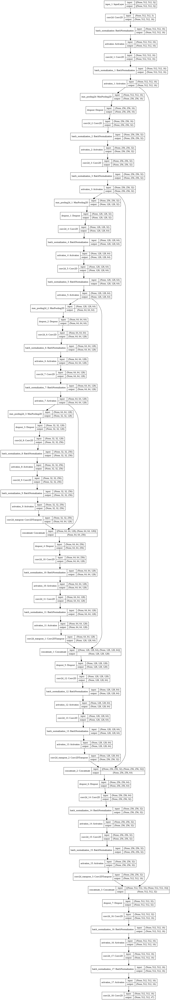

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
#https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2
#https://gist.github.com/wassname/7793e2058c5c9dacb5212c0ac0b18a8a
from keras import backend as K
def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return iou

In [ ]:
#iou = tf.keras.metrics.MeanIoU(num_classes=2)
model.compile(optimizer=tf.keras.optimizers.Adam(),loss=bce_dice_loss,metrics=[dice_coef])

In [ ]:
filepath="/content/drive/MyDrive/unet/weights.{epoch:03d}-{val_dice_coef:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_dice_coef', verbose=1, mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef',patience=5,mode='max')
reducelr_tenpercent = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_dice_coef',factor=0.9,patience=4,verbose=1)

callbacks = [checkpoint,early_stopping,checkpoint]
history1 = model.fit(train ,epochs=10,validation_data=valid,steps_per_epoch=2000,validation_steps=200,callbacks=callbacks)

Epoch 1/10
2000/2000 [==============================] - 753s 375ms/step - loss: 1.1223 - dice_coef: 0.0589 - val_loss: 0.8962 - val_dice_coef: 0.1559

Epoch 00001: saving model to /content/drive/MyDrive/unet/weights.001-0.15593.hdf5

Epoch 00001: saving model to /content/drive/MyDrive/unet/weights.001-0.15593.hdf5
Epoch 2/10
2000/2000 [==============================] - 764s 382ms/step - loss: 0.8583 - dice_coef: 0.1799 - val_loss: 0.9325 - val_dice_coef: 0.1122

Epoch 00002: saving model to /content/drive/MyDrive/unet/weights.002-0.11222.hdf5

Epoch 00002: saving model to /content/drive/MyDrive/unet/weights.002-0.11222.hdf5
Epoch 3/10
2000/2000 [==============================] - 762s 381ms/step - loss: 0.8357 - dice_coef: 0.2016 - val_loss: 0.9168 - val_dice_coef: 0.1418

Epoch 00003: saving model to /content/drive/MyDrive/unet/weights.003-0.14184.hdf5

Epoch 00003: saving model to /content/drive/MyDrive/unet/weights.003-0.14184.hdf5
Epoch 4/10
2000/2000 [==============================

In [ ]:
from keras.models import load_model
model = tf.keras.models.load_model('/content/drive/MyDrive/unet/weights.010-0.19335.hdf5',custom_objects={'bce_dice_loss':bce_dice_loss,'dice_coef':dice_coef})
model.compile(optimizer=tf.keras.optimizers.Adam(),loss=bce_dice_loss,metrics=[dice_coef])

In [ ]:
filepath="/content/drive/MyDrive/unet_contiunuation/weights.{epoch:03d}-{val_dice_coef:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_dice_coef', verbose=1, mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef',patience=15,mode='max')
reducelr_tenpercent = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_dice_coef',factor=0.9,patience=4,verbose=1)

callbacks = [checkpoint,early_stopping,checkpoint]
history1 = model.fit(train ,epochs=50,validation_data=valid,steps_per_epoch=4000,validation_steps=500,callbacks=callbacks)

Epoch 1/50
4000/4000 [==============================] - 1186s 296ms/step - loss: 0.7838 - dice_coef: 0.2527 - val_loss: 0.8399 - val_dice_coef: 0.2035

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation/weights.001-0.20355.hdf5

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation/weights.001-0.20355.hdf5
Epoch 2/50
4000/4000 [==============================] - 1298s 324ms/step - loss: 0.7751 - dice_coef: 0.2607 - val_loss: 0.8428 - val_dice_coef: 0.1959

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation/weights.002-0.19586.hdf5

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation/weights.002-0.19586.hdf5
Epoch 3/50
4000/4000 [==============================] - 1123s 281ms/step - loss: 0.7682 - dice_coef: 0.2681 - val_loss: 0.8643 - val_dice_coef: 0.1800

Epoch 00003: saving model to /content/drive/MyDrive/unet_contiunuation/weights.003-0.17996.hdf5

Epoch 00003: saving model to /content/drive/MyDrive/unet_cont

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/unet_contiunuation/weights.006-0.20311.hdf5',custom_objects={'bce_dice_loss':bce_dice_loss,'dice_coef':dice_coef})
model.compile(optimizer=tf.keras.optimizers.Adam(),loss=bce_dice_loss,metrics=[dice_coef])

In [ ]:
filepath="/content/drive/MyDrive/unet_contiunuation_again/weights.{epoch:03d}-{val_dice_coef:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_dice_coef', verbose=1, mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef',patience=15,mode='max')
reducelr_tenpercent = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_dice_coef',factor=0.9,patience=4,verbose=1)
9
callbacks = [checkpoint,early_stopping,checkpoint]
history1 = model.fit(train ,epochs=50,validation_data=valid,steps_per_epoch=4000,validation_steps=500,callbacks=callbacks)

Epoch 1/50
4000/4000 [==============================] - 1273s 318ms/step - loss: 0.7522 - dice_coef: 0.2842 - val_loss: 0.8581 - val_dice_coef: 0.1843

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation_again/weights.001-0.18429.hdf5

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation_again/weights.001-0.18429.hdf5
Epoch 2/50
4000/4000 [==============================] - 1326s 332ms/step - loss: 0.7384 - dice_coef: 0.2969 - val_loss: 0.8748 - val_dice_coef: 0.1652

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation_again/weights.002-0.16517.hdf5

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation_again/weights.002-0.16517.hdf5
Epoch 3/50
4000/4000 [==============================] - 1292s 323ms/step - loss: 0.7393 - dice_coef: 0.2959 - val_loss: 0.9147 - val_dice_coef: 0.1238

Epoch 00003: saving model to /content/drive/MyDrive/unet_contiunuation_again/weights.003-0.12383.hdf5

Epoch 00003: saving model to /c

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/unet_contiunuation_again/weights.019-0.12558.hdf5',custom_objects={'bce_dice_loss':bce_dice_loss,'dice_coef':dice_coef})
model.compile(optimizer=tf.keras.optimizers.Adam(),loss=bce_dice_loss,metrics=[dice_coef])

In [ ]:
filepath="/content/drive/MyDrive/unet_contiunuation_again_1/weights.{epoch:03d}-{val_dice_coef:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_dice_coef', verbose=1, mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef',patience=15,mode='max')
reducelr_tenpercent = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_dice_coef',factor=0.9,patience=4,verbose=1)

callbacks = [checkpoint,early_stopping,checkpoint,reducelr_tenpercent]
history1 = model.fit(train ,epochs=50,validation_data=valid,steps_per_epoch=3000,validation_steps=500,callbacks=callbacks)

Epoch 1/50
3000/3000 [==============================] - 874s 279ms/step - loss: 0.6461 - dice_coef: 0.3877 - val_loss: 0.8983 - val_dice_coef: 0.1415

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation_again_1/weights.001-0.14149.hdf5

Epoch 00001: saving model to /content/drive/MyDrive/unet_contiunuation_again_1/weights.001-0.14149.hdf5
Epoch 2/50
3000/3000 [==============================] - 847s 282ms/step - loss: 0.6429 - dice_coef: 0.3904 - val_loss: 0.9076 - val_dice_coef: 0.1281

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation_again_1/weights.002-0.12807.hdf5

Epoch 00002: saving model to /content/drive/MyDrive/unet_contiunuation_again_1/weights.002-0.12807.hdf5
Epoch 3/50
3000/3000 [==============================] - 844s 282ms/step - loss: 0.6611 - dice_coef: 0.3725 - val_loss: 0.9010 - val_dice_coef: 0.1366

Epoch 00003: saving model to /content/drive/MyDrive/unet_contiunuation_again_1/weights.003-0.13659.hdf5

Epoch 00003: saving mode

In [ ]:
gc.collect()

283

In [ ]:
os.remove('train/ac32b7122e67e77ce1b48bbba4d90460.jpg')

In [ ]:
i = train_df[train_df['ImageId']=='ac32b7122e67e77ce1b48bbba4d90460.jpg'].index
print(i)
train_df.drop(index=i,inplace=True)

In [ ]:
i = train_df[train_df['ImageId']=='ac32b7122e67e77ce1b48bbba4d90460.jpg'].index
print(i)
train_df.drop(index=i,inplace=True)
i = val_df[val_df['ImageId']=='ac32b7122e67e77ce1b48bbba4d90460.jpg'].index
print(i)
val_df.drop(i,inplace=True)

Int64Index([], dtype='int64')
Int64Index([], dtype='int64')


In [ ]:
#https://stackoverflow.com/questions/62586443/tensorflow-error-when-trying-transfer-learning-invalid-jpeg-data-or-crop-windo
#https://github.com/tensorflow/tensorflow/issues/7434

'''There is a bug in some images to remove that images i have refered form above links'''
from struct import unpack
import os


marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}


class JPEG:
    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            # print(marker_mapping.get(marker))
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


bads = []

for img in tqdm(glob.glob('train/*')):
  image = JPEG(img) 
  try:
    image.decode()   
  except:
    bads.append(img)


for name in bads:
  #os.remove(osp.join(root_img,name))
  print(name)

100%|██████████| 30444/30444 [06:15<00:00, 81.11it/s]

train/ac32b7122e67e77ce1b48bbba4d90460.jpg


In [ ]:
predict = model.predict(img[np.newaxis,:,:,:])
predict = np.where(predict>0.4,1,predict)
predict = np.where(predict<0.4,0,predict)

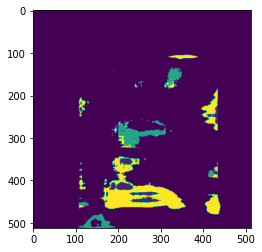

In [ ]:
plt.imshow(np.argmax(predict[0],axis=-1))

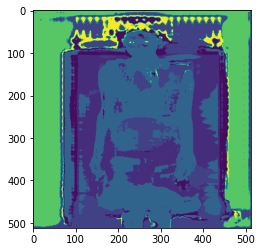

In [ ]:
img = tf.image.decode_jpeg(tf.io.read_file('/content/train/000b3a87508b0fa185fbd53ecbe2e4c6.jpg'))
## Initially it wil be BGR format so we will convert to RGB 
img = tf.image.resize(img, [512, 512],method='nearest')
predicted = model.predict(img[np.newaxis,:,:,:])
predicted = tf.argmax(predicted,axis=-1)
plt.imshow(predicted[0])

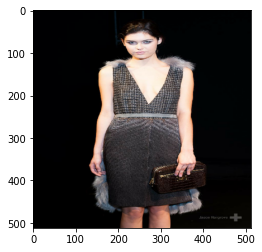

In [ ]:
plt.imshow(img)

In [ ]:
val_df.tail()

,ImageId,EncodedPixels,Category,Height,Width
6083,ac19f00a4b0092c3d3ef55714bd876d0.jpg,['3866464 5 3869967 14 3873470 23 3876973 31 3...,"['33', '10', '23', '23']",3508,2832
6084,ac1a3b2bd95dee286849d0d34f4d63c1.jpg,['2476034 4 2479025 13 2482016 22 2485012 26 2...,"['33', '31', '31', '10']",3000,1997
6085,ac1c3d5a9c672b5b9e585901ada643a6.jpg,['313609 2 314584 7 315558 13 316533 18 317508...,"['6', '23', '23', '31', '31', '10', '18', '31'...",975,650
6086,ac1e5b321ab83abc61005be87fccaac1.jpg,['998430 22 999429 25 1000428 28 1001427 31 10...,"['33', '31', '31', '45', '45', '33', '1', '1']",1000,1920
6087,ac2d891e988e82678b741d9015ab2304.jpg,['1724114 2 1726365 4 1728616 6 1730867 8 1733...,"['33', '10', '23', '23']",2250,1500


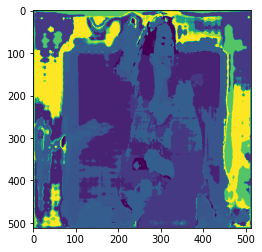

In [ ]:
img = tf.image.decode_jpeg(tf.io.read_file('train/ac1e5b321ab83abc61005be87fccaac1.jpg'))
## Initially it wil be BGR format so we will convert to RGB 
img = tf.image.resize(img, [512, 512],method='nearest')
predicted = model.predict(img[np.newaxis,:,:,:])
predicted = tf.argmax(predicted,axis=-1)
plt.imshow(predicted[0])

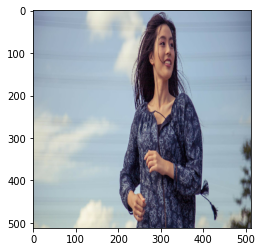

In [ ]:
plt.imshow(img)

# MaskRcnn

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
!pip install keras==2.1.5

  Using cached https://files.pythonhosted.org/packages/ba/65/e4aff762b8696ec0626a6654b1e73b396fcc8b7cc6b98d78a1bc53b85b48/Keras-2.1.5-py2.py3-none-any.whl
  Found existing installation: Keras 2.3.1
    Uninstalling Keras-2.3.1:
      Successfully uninstalled Keras-2.3.1


In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
import numpy as np
import seaborn as sns
from tensorflow.keras.layers import *
from tensorflow.keras.losses import binary_crossentropy
from tensorflow import reduce_sum
import time

from tensorflow.keras import Model
import random
import warnings
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from keras import backend as K
from skimage.measure import label, regionprops
warnings.filterwarnings('ignore')
import gc
import json

Using TensorFlow backend.


In [2]:
tf.__version__

'1.15.0'

In [ ]:
##https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07 
##The training with MaskRcnn is adopted from this kernel

In [2]:
!git clone https://www.github.com/matterport/Mask_RCNN.git
os.chdir('Mask_RCNN')

#!rm -rf .git # to prevent an error when the kernel is committed
#!rm -rf images assets # to prevent displaying images at the bottom of a kernel

fatal: destination path 'Mask_RCNN' already exists and is not an empty directory.


In [3]:
import sys
sys.path.append('Mask_RCNN')
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [ ]:
!wget --quiet https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
!ls -lh mask_rcnn_coco.h5

COCO_WEIGHTS_PATH = 'mask_rcnn_coco.h5'

-rw-r--r-- 1 root root 246M Nov 26  2017 mask_rcnn_coco.h5


In [4]:
class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = 46 + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 6 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     6
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 6
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                59
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                

### Train_test_split

In [6]:
IMAGE_SIZE = 512

In [9]:
with open('D:\\Appliedaicourse\\Casestudy2\\data\\label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]
print(len(label_names),label_names[:5])

46 ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket']


In [10]:
data = pd.read_csv('D:\\Appliedaicourse\\Casestudy2\\data\\train.csv')
data['CategoryId'] = data['ClassId'].str.split('_').str[0]
data.shape

(331213, 6)

In [ ]:
data = data[data['ImageId'].isin(os.listdir('D:\\Appliedaicourse\\Casestudy2\\data\\train'))]

In [11]:
image_df = data.groupby('ImageId')['EncodedPixels', 'CategoryId'].agg(lambda x: list(x))
size_df = data.groupby('ImageId')['Height', 'Width'].mean()
image_df = image_df.join(size_df, on='ImageId')

print("Total images: ", len(image_df))
image_df.head()

Total images:  45195


,EncodedPixels,CategoryId,Height,Width
ImageId,,,,
00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214,3676
0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448,2448
0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000,1997
0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567,400
0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750,500


In [12]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    ## Changing Image from BLUE_Greenn_Red to Red_Green_Blue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ## Resizing Image
    img = cv2.resize(img, (512, 512), interpolation=cv2.INTER_AREA)  
    return img

In [ ]:
class FashionDataset(utils.Dataset):
    # Giving data as per the Maskrcnn git
    def __init__(self, df):
        super().__init__(self)
        
        # Add classes
        for i, name in enumerate(label_names):
            self.add_class("fashion", i+1, name)
        
        # Add images 
        for i, row in df.iterrows():
            self.add_image("fashion", 
                           image_id=row.name, 
                           path=str('/content/train/'+row.name), 
                           labels=row['CategoryId'],
                           annotations=row['EncodedPixels'], 
                           height=row['Height'], width=row['Width'])

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path'], [label_names[int(x)] for x in info['labels']]
    
    def load_image(self, image_id):
        return resize_image(self.image_info[image_id]['path'])

    def load_mask(self, image_id):
        info = self.image_info[image_id]
                
        mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE, len(info['annotations'])), dtype=np.uint8)
        labels = []
        
        for m, (annotation, label) in enumerate(zip(info['annotations'], info['labels'])):
            sub_mask = np.full(info['height']*info['width'], 0, dtype=np.uint8)
            annotation = [int(x) for x in annotation.split(' ')]
            
            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape((info['height'], info['width']), order='F')
            sub_mask = cv2.resize(sub_mask, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_NEAREST)
            
            mask[:, :, m] = sub_mask
            labels.append(int(label)+1)
            
        return mask, np.array(labels)


In [ ]:
data_s = FashionDataset(image_df)
data_s.prepare()

In [ ]:
FOLD = 0
N_FOLD = 5
from sklearn.model_selection import StratifiedKFold, KFold
kf = KFold(n_splits=N_FOLD, random_state=23, shuffle=True)
splits = kf.split(image_df) 

def get_fold():    
    for i, (train_i, valid_i) in enumerate(splits):
        if i == FOLD:
            return image_df.iloc[train_i], image_df.iloc[valid_i]
        
train, valid = get_fold()

train_data = FashionDataset(train)
train_data.prepare()

valid_data = FashionDataset(valid)
valid_data.prepare()

The Total Number of train images:  24077
The Total Number of train segments:  175449


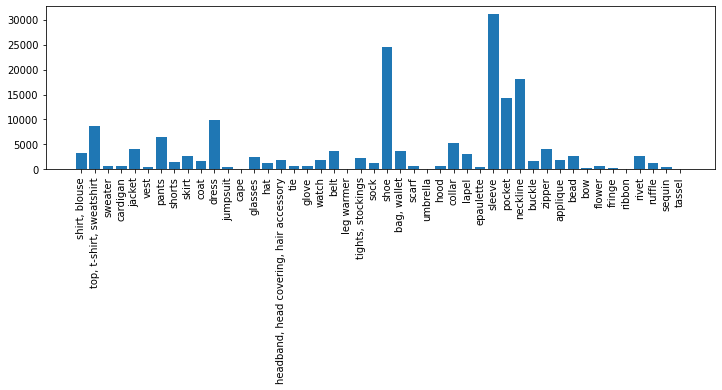

The Total Number of validation segments images:  6020
THe Total Number of validation segments:  44297


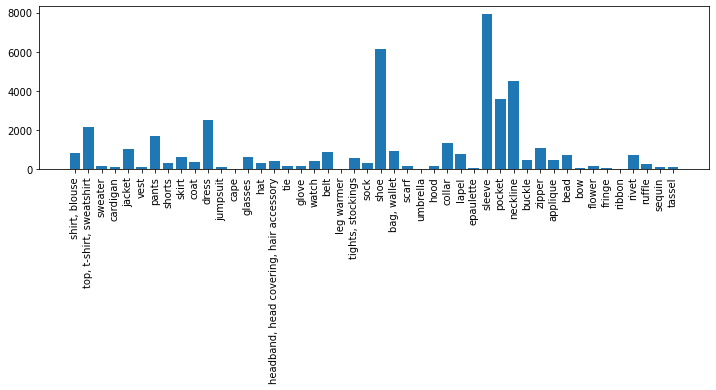

In [ ]:
train_mask_s = np.concatenate(train['CategoryId'].values).astype(int)
print("The Total Number of train images: ", len(train))
print("The Total Number of train segments: ", len(train_mask_s))

plt.figure(figsize=(12, 3))
value, count = np.unique(train_mask_s, return_counts=True)
plt.bar(value, count)
plt.xticks(value, label_names, rotation='vertical')
plt.show()

valid_mask_s = np.concatenate(valid['CategoryId'].values).astype(int)
print("The Total Number of validation segments images: ", len(valid))
print("THe Total Number of validation segments: ", len(valid_mask_s))

plt.figure(figsize=(12, 3))
value, count = np.unique(valid_mask_s, return_counts=True)
plt.bar(value, count)
plt.xticks(value, label_names, rotation='vertical')
plt.show()


In [ ]:
model = modellib.MaskRCNN(mode='training', config=config, model_dir='content')
model.set_log_dir(model_path='/content/drive/MyDrive/mrcnn/')
model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
from imgaug import augmenters as iaa
augmentation = iaa.Sequential([
    iaa.Fliplr(0.5) # only horizontal flip here
])

In [ ]:
LR = 1e-4
#https://github.com/matterport/Mask_RCNN/issues/1299

In [ ]:
import keras

In [ ]:
%%time
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/mrcnn1/mask_rcnn_fashion_{epoch:04d}-{val_mrcnn_mask_loss:.5f}.h5',save_weights_only=True,verbose=1)
model.train(train_dataset, valid_dataset,
            learning_rate=LR,
            epochs=10,
            layers='all',
            augmentation=augmentation,custom_callbacks=[checkpoint])




Starting at epoch 0. LR=0.0001

Checkpoint Path: content/fashion20210309T1211/mask_rcnn_fashion_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b          (Ba

In [ ]:
new_history = model.keras_model.history.history
history ={}
for k in new_history:
  print(k) 
  history[k] =   new_history[k]

val_loss
val_rpn_class_loss
val_rpn_bbox_loss
val_mrcnn_class_loss
val_mrcnn_bbox_loss
val_mrcnn_mask_loss
loss
rpn_class_loss
rpn_bbox_loss
mrcnn_class_loss
mrcnn_bbox_loss
mrcnn_mask_loss


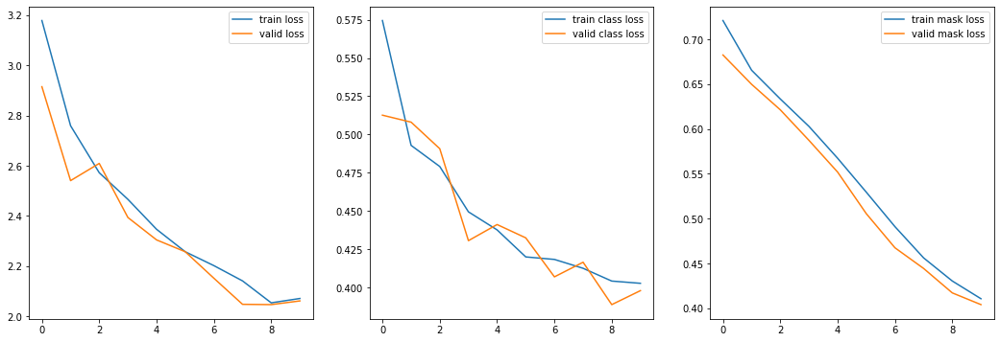

In [ ]:
epochs = range(10)
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.plot(epochs, history['loss'], label="train loss")
plt.plot(epochs, history['val_loss'], label="valid loss")
plt.title("Loss")
plt.legend()
plt.subplot(132)
plt.plot(epochs, history['mrcnn_class_loss'], label="train class loss")
plt.plot(epochs, history['val_mrcnn_class_loss'], label="valid class loss")
plt.title('mrcnn_class_loss')
plt.legend()
plt.subplot(133)
plt.plot(epochs, history['mrcnn_mask_loss'], label="train mask loss")
plt.plot(epochs, history['val_mrcnn_mask_loss'], label="valid mask loss")
plt.legend()

plt.show()

In [ ]:
model = modellib.MaskRCNN(mode='training', config=config, model_dir='content')
model.set_log_dir(model_path='/content/drive/MyDrive/mrcnn/')
model.load_weights('/content/drive/MyDrive/mrcnn1/mask_rcnn_fashion_0010-0.40404.h5', by_name=True)

In [ ]:
from imgaug import augmenters as iaa
augmentation = iaa.Sequential([
    iaa.Fliplr(0.5) # only horizontal flip here
])

In [ ]:
LR = 1e-4
import keras

In [ ]:
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/mrcnn2/mask_rcnn_fashion_{epoch:04d}-{val_mrcnn_mask_loss:.5f}.h5',save_weights_only=True,verbose=1)
model.train(train_data, valid_data,
            learning_rate=LR/6,
            epochs=7,
            layers='all',
            augmentation=augmentation,custom_callbacks=[checkpoint])


Starting at epoch 0. LR=0.0001

Checkpoint Path: content/fashion20210312T0445/mask_rcnn_fashion_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b          (Ba

In [ ]:

class InferenceConfig(FashionConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir='/content/')

model_path ='/content/drive/MyDrive/mrcnn1/mask_rcnn_fashion_0010-0.40404.h5'
assert model_path != '', "Provide path to trained weights"


print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)#load trained model

Loading weights from  /content/drive/MyDrive/mrcnn1/mask_rcnn_fashion_0010-0.40404.h5


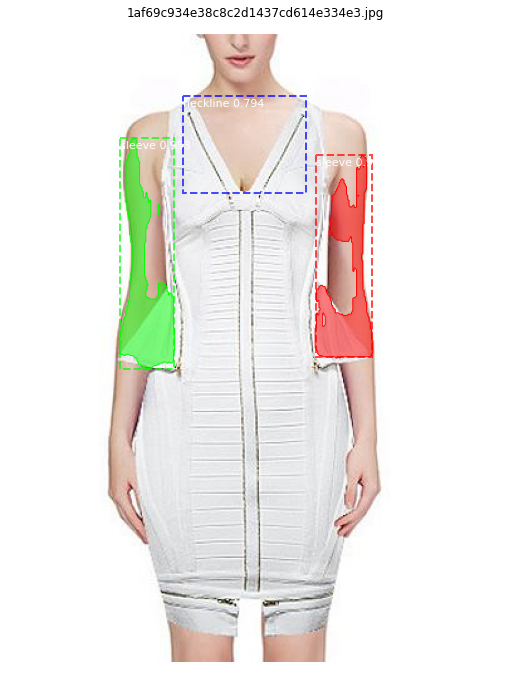

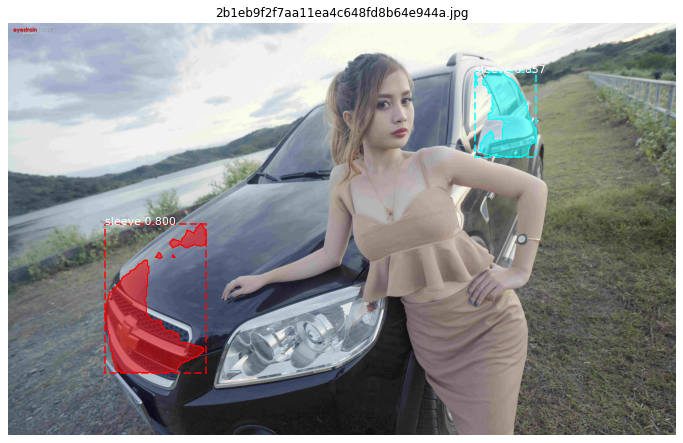

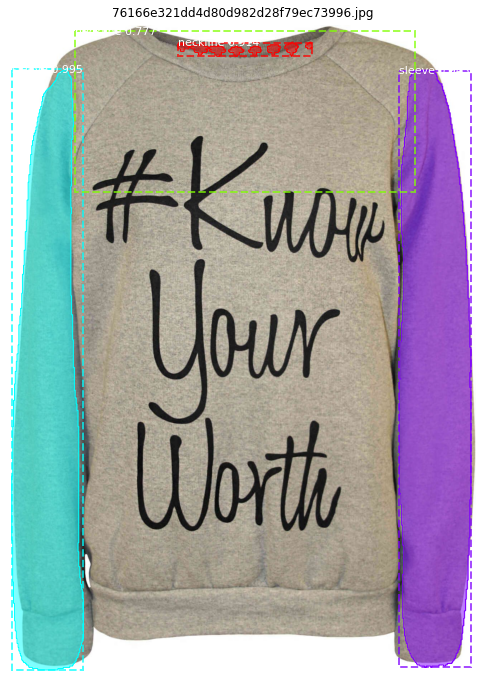

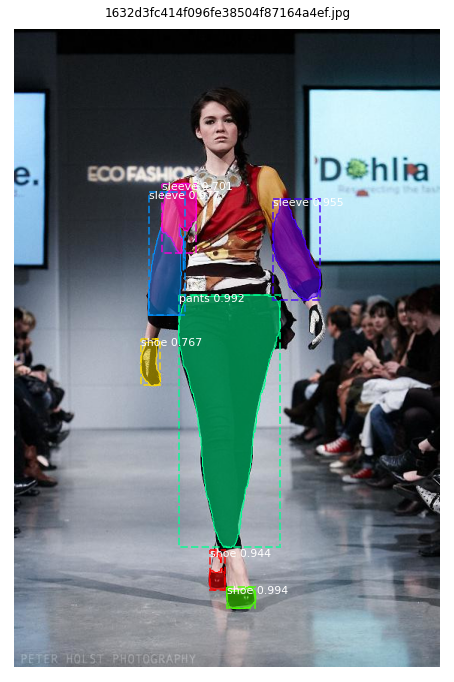

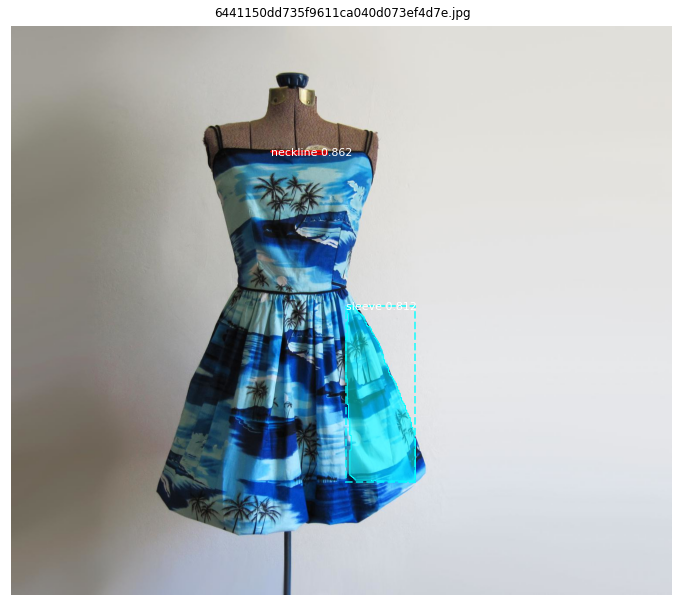

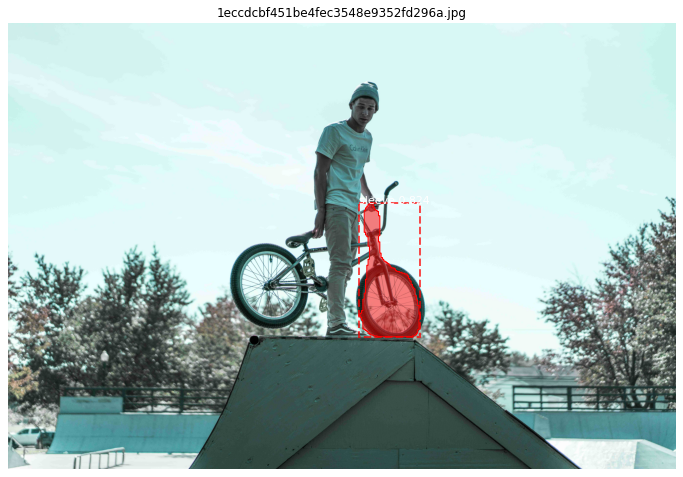

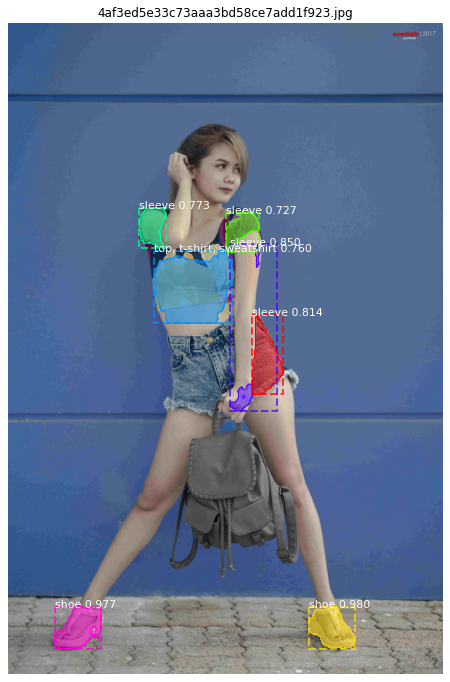

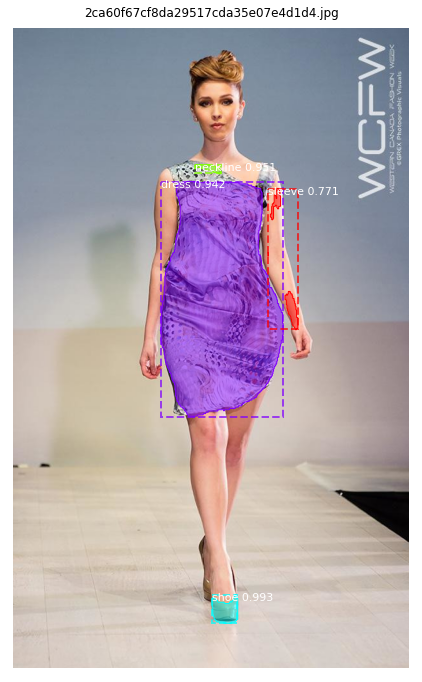

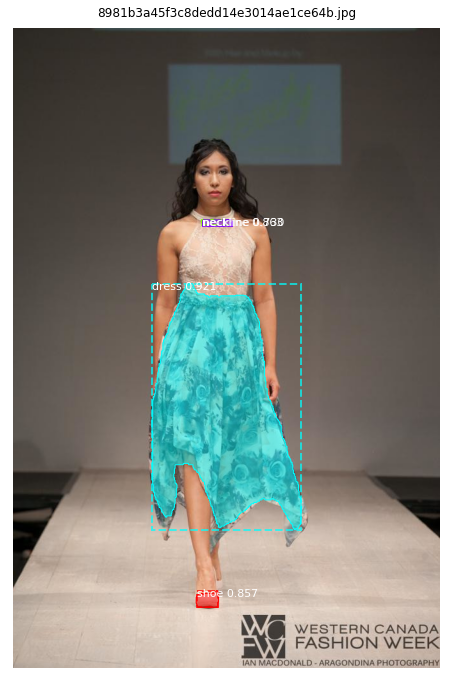

In [ ]:
for i in range(9):
    image_id = image_df.reset_index().sample()['ImageId'].values[0]
    image_path = str('/content/train/'+image_id)
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    result = model.detect([resize_image(image_path)])
    r = result[0]
    
    if r['masks'].size > 0:
        masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
        for m in range(r['masks'].shape[-1]):
            masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        y_scale = img.shape[0]/IMAGE_SIZE
        x_scale = img.shape[1]/IMAGE_SIZE
        rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
    else:
        masks, rois = r['masks'], r['rois']
        
    visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

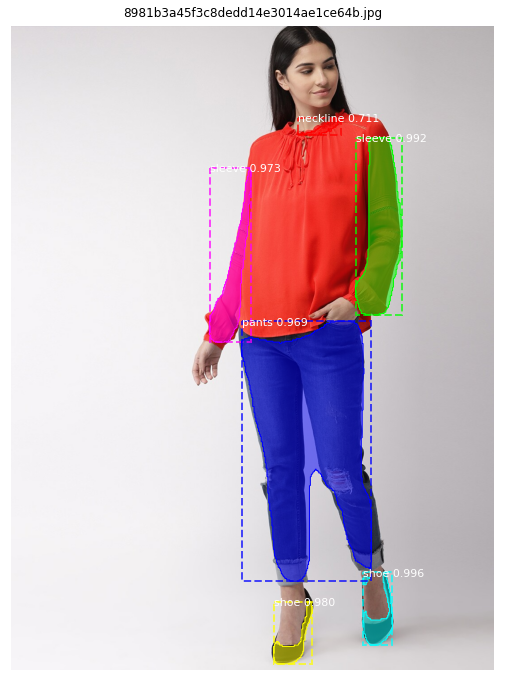

In [ ]:
image_path = str('/content/image5_4.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

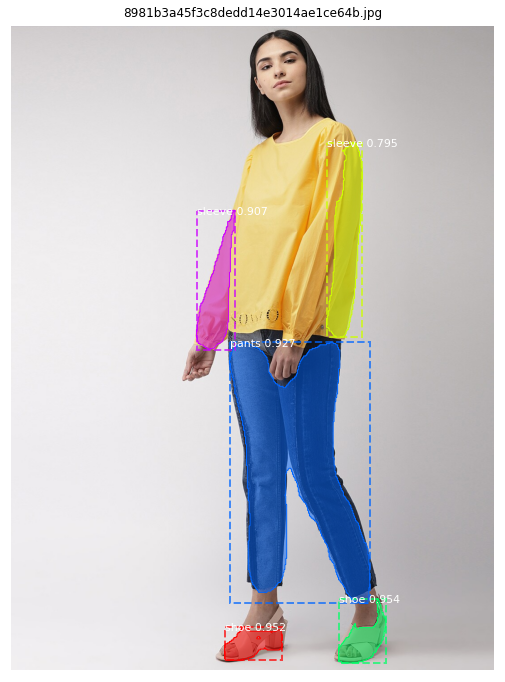

In [ ]:
image_path = str('/content/image4_4.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

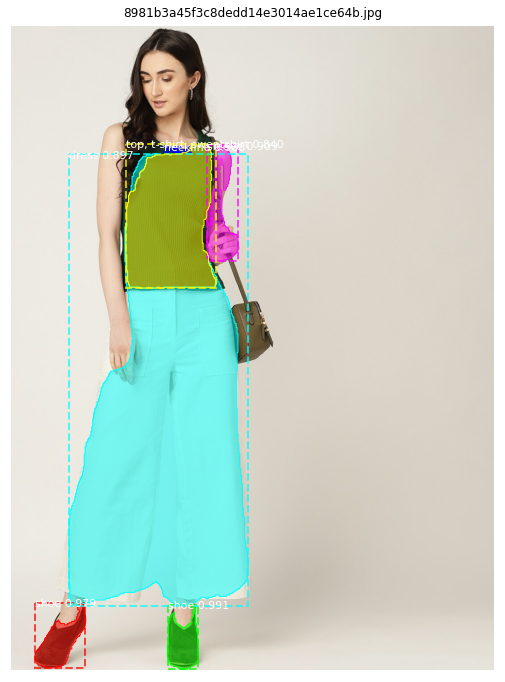

In [ ]:
image_path = str('/content/image24_3.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

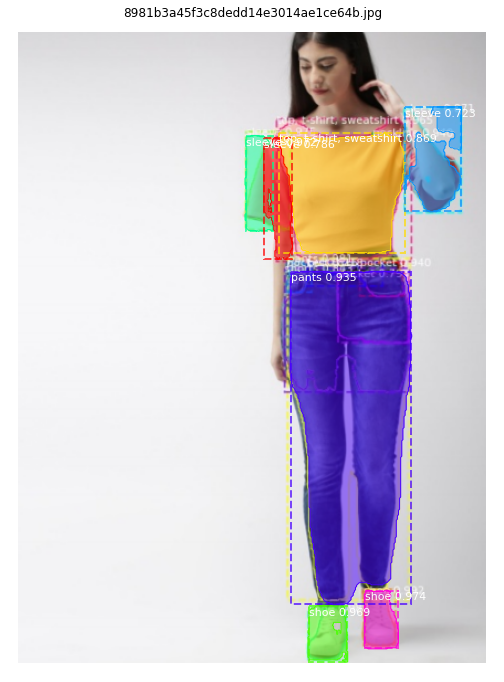

In [ ]:
image_path = str('/content/image.png')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

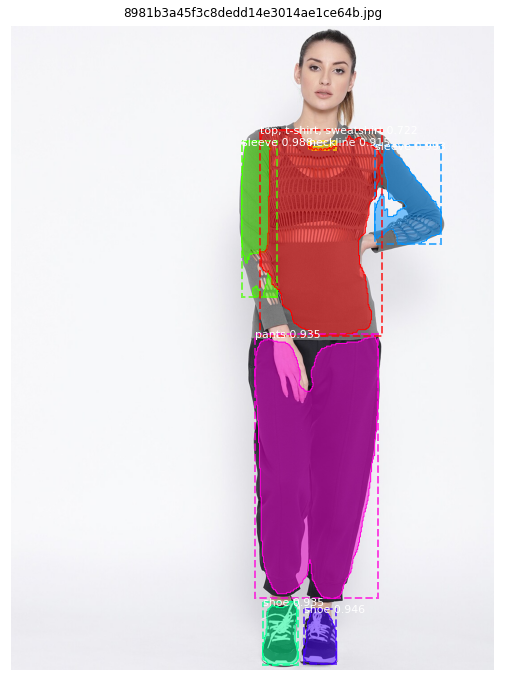

In [ ]:
image_path = str('/content/image33_4.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

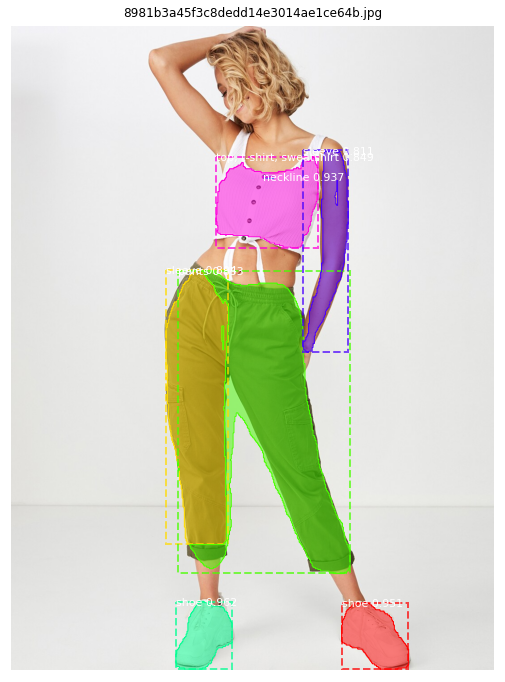

In [ ]:
image_path = str('/content/image47_0.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

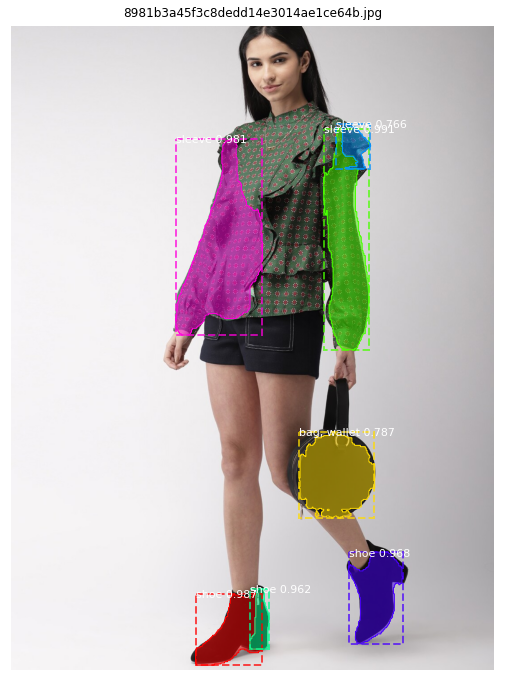

In [ ]:
image_path = str('/content/image2_4.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

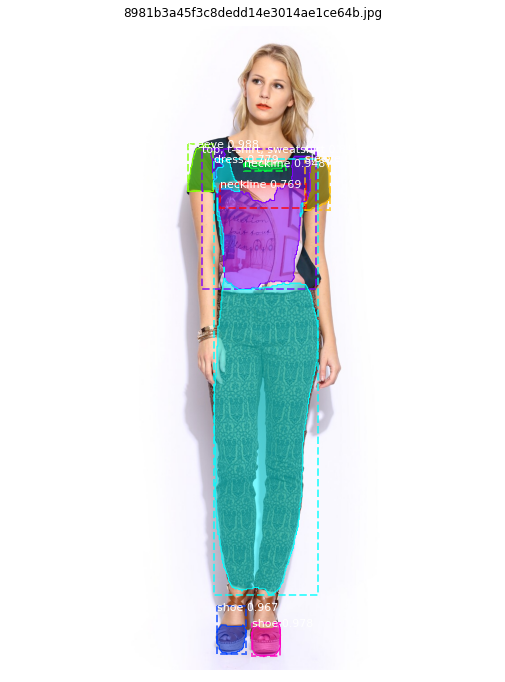

In [ ]:
image_path = str('/content/image9_5.jpg')
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
result = model.detect([resize_image(image_path)])
r = result[0]
    
if r['masks'].size > 0:
    masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
    for m in range(r['masks'].shape[-1]):
        masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    y_scale = img.shape[0]/IMAGE_SIZE
    x_scale = img.shape[1]/IMAGE_SIZE
    rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
else:
     masks, rois = r['masks'], r['rois']
        
visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

In [14]:

class InferenceConfig(FashionConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir='\\D:\Appliedaicourse\Casestudy2\\')

model_path ='D:/Appliedaicourse/Casestudy2/mask_rcnn_fashion_0005-0.34882.h5'
assert model_path != '', "Provide path to trained weights"


print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)#load trained model

Loading weights from  D:/Appliedaicourse/Casestudy2/mask_rcnn_fashion_0005-0.34882.h5


D:\Appliedaicourse\Casestudy2\data\train\813e3c0edc2ea13504ed2d12b12443a7.jpg
True



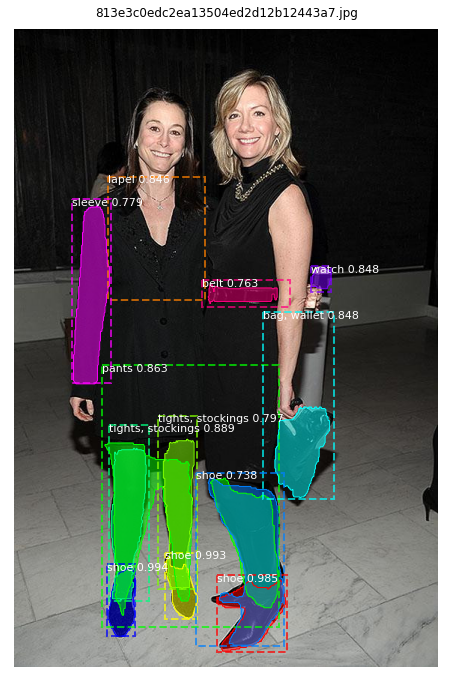

D:\Appliedaicourse\Casestudy2\data\train\1770fe539dc3b0e5cd24ec3c7e103e98.jpg
True


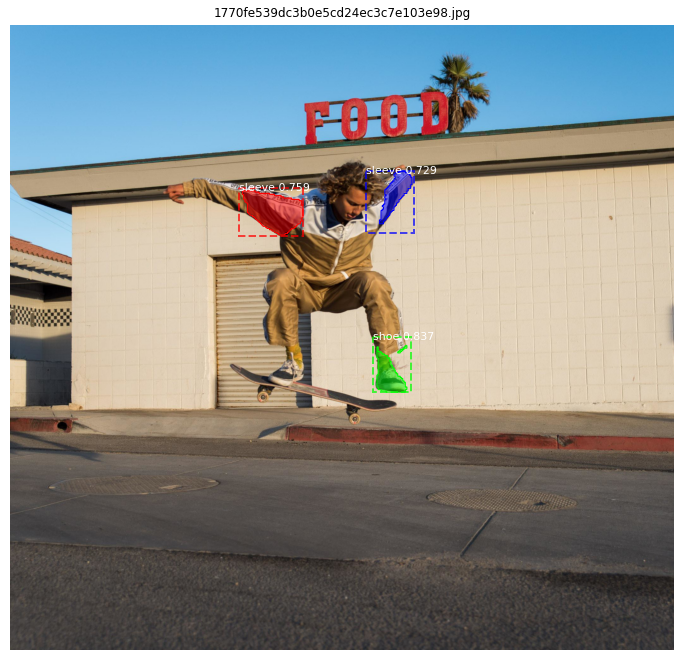

D:\Appliedaicourse\Casestudy2\data\train\379c142f0c399e7ec816210dc04d52f2.jpg
True


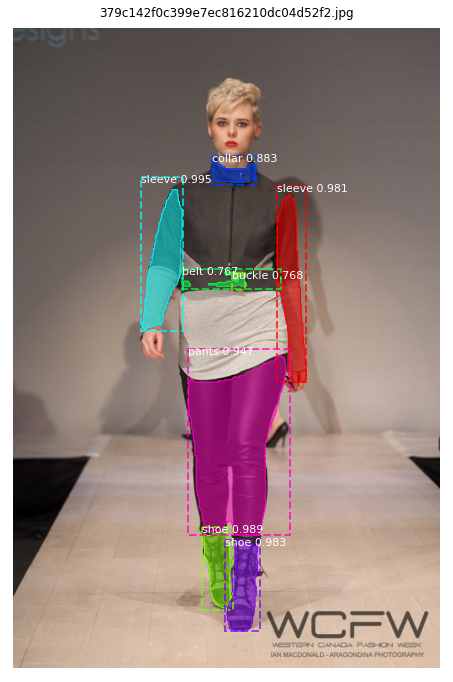

D:\Appliedaicourse\Casestudy2\data\train\5e4c7750d33fb89c3749695e9c859a28.jpg
True


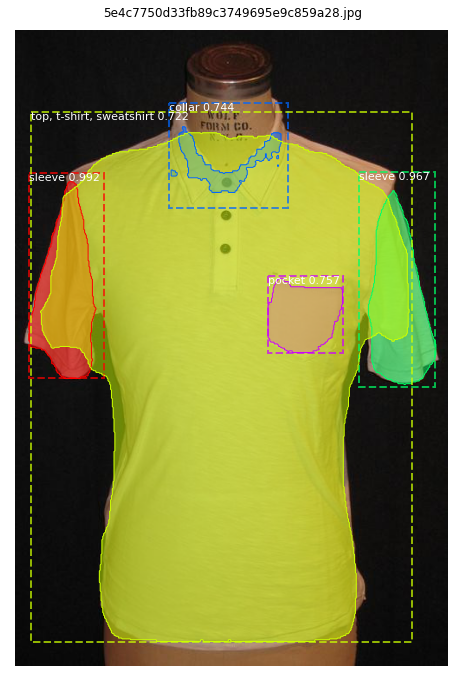

D:\Appliedaicourse\Casestudy2\data\train\c999d591263a3a04996ee616921fc139.jpg
True


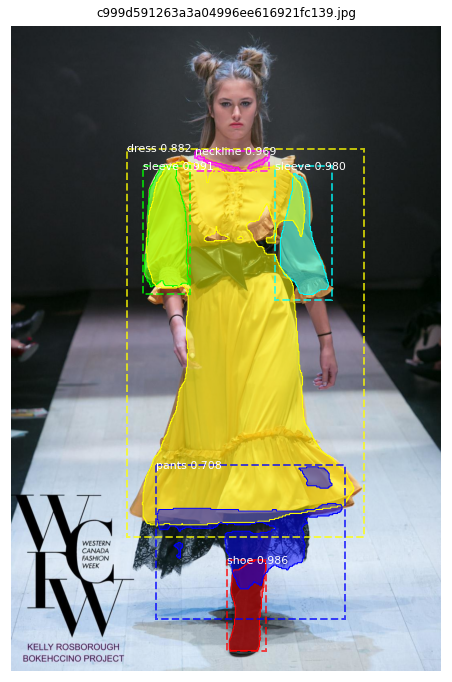

D:\Appliedaicourse\Casestudy2\data\train\dba891219d8a5d561a3fea092318d6e6.jpg
True


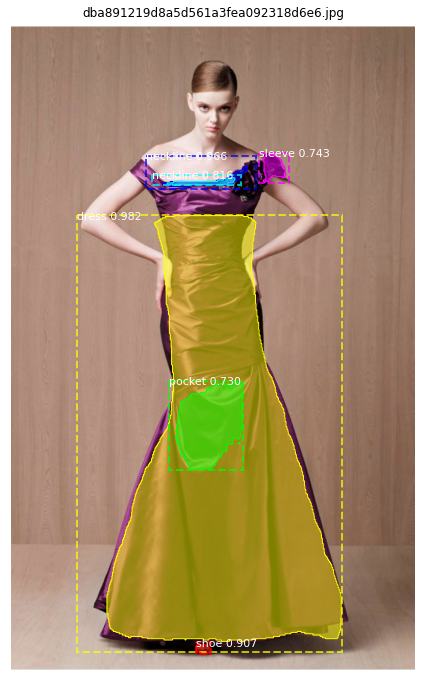

D:\Appliedaicourse\Casestudy2\data\train\c4a13ddc1eda21fd1ea2c5576094193d.jpg
True


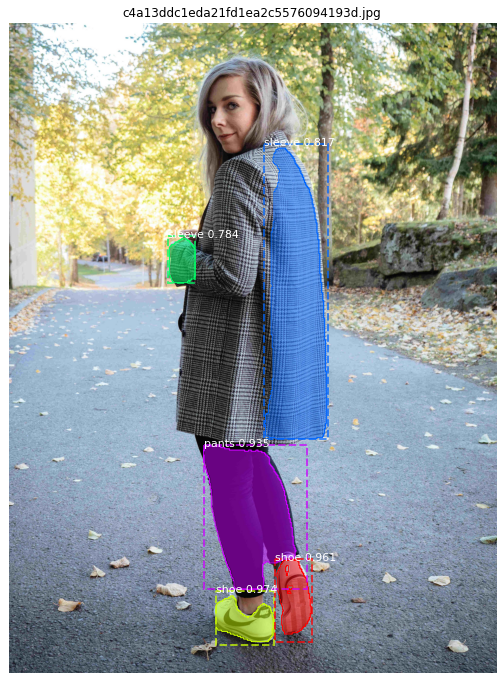

D:\Appliedaicourse\Casestudy2\data\train\770cb921a624f95748aa619571ed1812.jpg
True


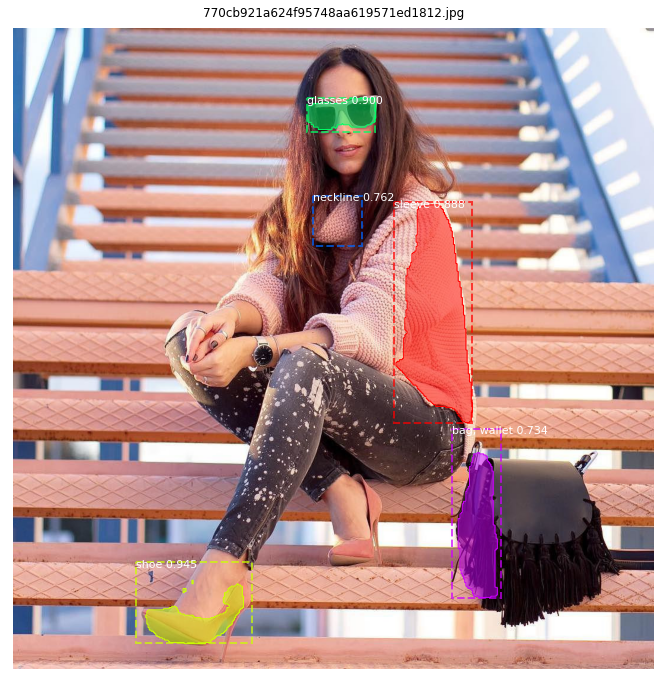

D:\Appliedaicourse\Casestudy2\data\train\ab1c143a2c4ed32b9f7bbf84b0d75ed2.jpg
True


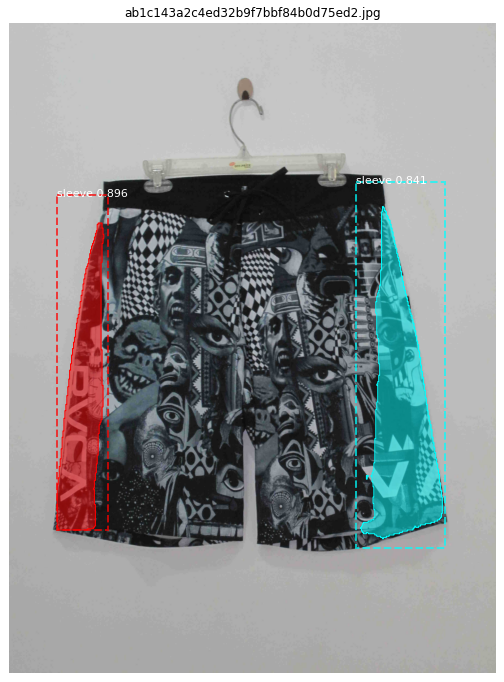

In [15]:
for i in range(9):
    image_id = image_df.reset_index().sample()['ImageId'].values[0]
    image_path = str('D:\\Appliedaicourse\\Casestudy2\\data\\train\\'+image_id)
    print(image_path)
    print(os.path.isfile(image_path))
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ##Here model.detect returns's the dict of  RIOS - Bounding boxes,class_id,SCores,and Masks
    result = model.detect([resize_image(image_path)])
    r = result[0]
    
    if r['masks'].size > 0:
        masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
        for m in range(r['masks'].shape[-1]):
            masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        y_scale = img.shape[0]/IMAGE_SIZE
        x_scale = img.shape[1]/IMAGE_SIZE
        rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
    else:
        masks, rois = r['masks'], r['rois']
        
    visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12))

# Now getting the Upper_body, lower and feet for dresses

In [16]:
#combine categories for simplification
foot_wear = ['shoe']

upper_body_wear = ['vest','top, t-shirt, sweatshirt','sweater','sleeve','shirt, blouse','neckline','lapel','jacket','hood',
              'epaulette','collar','cardigan',]
lower_body_wear =['pocket', 'pants', 'shorts', 'skirt']
wholebody = ['cape', 'coat', 'dress', 'jumpsuit']


In [17]:
def get_bbox(image_path):
    '''input: Takes the  image_path
       output: it detects the mask,bboxes and 
       also it send the dictionary contains with class id,score,masks,boxes'''
    
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    result = model.detect([resize_image(image_path)])
    
    if result[0]['masks'].size > 0:
        mask = np.zeros((image.shape[0], image.shape[1], result[0]['masks'].shape[-1]), dtype=np.uint8)
        for m in range(result[0]['masks'].shape[-1]):
            mask[:, :, m] = cv2.resize(result[0]['masks'][:, :, m].astype('uint8'), 
                                        (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
        y = image.shape[0]/512
        x = image.shape[1]/512
        boxes = (result[0]['rois'] * [y, x, y, x]).astype(int)
        
    else:
         mask, boxes = result[0]['masks'], result[0]['boxes']
    return image,mask,boxes,result

In [18]:
def get_bounding_box_for_parts(img,boxes,result,class_names):
    '''Input : image,boxes result from model,class_names list
       Output : returns a tuple of 3 list contain foot,upper_wear,lower_body wear'''
    
    #boxes = result[0]['rois']
    class_id = result[0]['class_ids']
    scores = result[0]['scores']
    masks = result[0]['masks']
    height , width = img.shape[:2]
    foot  = []
    upper_body = []
    lower_body = []
    whole_bod = []
    
    bool =  result[0]['rois'].shape[0] == result[0]['masks'].shape[-1] == result[0]['class_ids'].shape[0]
    if bool:
        if boxes is not None:
            for i in range(len(boxes)):
                y1,x1,y2,x2 = boxes[i]
                label  = class_names[class_id[i]-1]
                score_got  = scores[i] if scores is not None else 0
                if score_got >0.70:
                    if label in foot_wear:
                        foot.append((y1,x1,y2,x2))
                    if label in upper_body_wear:
                        upper_body.append((y1,x1,y2,x2))
                    if label in lower_body_wear:
                        lower_body.append((y1,x1,y2,x2))
                    if label in wholebody:
                        whole_bod.append((y1,x1,y2,x2))
    return upper_body,lower_body,foot
        
    

<br> Here cordinates are in the format of (y1,x1,y2,x2)=(y,x,width,height)

1.  get bbox
2.  get_bounding_box_for_parts 
3.  get the upper_wear,lower_wear,foot_wear

In [20]:
## Getting only the objects from the image
def crop(y1,x1,y2,x2,image):
    
    '''Input : co-ordinates,image
    It will crop the image with the given co-ordinates
    output: croped image'''
    
    output = image[int(y1):int(y2), int(x1):int(x2)]
    return output

def get_croped_images(upper_wear,lower_wear,foot_wear,img):
    '''Input :bounding_box of upper_wear,lower_wear,foot_wear
       Function -> This function will take the boundign box of upperwears like sleeve shirt pocket in this it will combine
                    all the bounding box parts of the particular portion and return the images of particular wear
       outpu : It returns the Upper_wear,Lower_wear,Foot wear Images'''
    ##getting full upper_body cropping
    if all([len(lower_wear)!=0, len(upper_wear)!=0 , len(foot_wear)!=0]):
        
        up_y1,up_x1 = np.min(np.array(upper_wear),axis=0)[:2]
        up_y2,up_x2 = np.max(np.array(upper_wear),axis=0)[2:]
        upper_image = crop(up_y1,up_x1,up_y2,up_x2,img)
        #Getting LowerImage
        L_y1,L_x1 =   np.min(np.array(lower_wear),axis=0)[:2]
        L_y2,L_x2 =   np.max(np.array(lower_wear),axis=0)[2:]
        lower_image = crop(L_y1,L_x1,L_y2,L_x2,img)
        ## Getting foot_wear
        F_y1,F_x1   = np.min(np.array(foot_wear),axis=0)[:2]
        F_y2,F_x2   = np.max(np.array(foot_wear),axis=0)[2:]
        foot_image  = crop(F_y1,F_x1,F_y2,F_x2,img)
        return upper_image,lower_image,foot_image
    else:
        print('Missing parts')
        return None


In [34]:
def plot_wears(image_path):
    '''Input : Image_path
       Function -> This function will plot images merging with upper_wear, lower_wear and Foot wear predicted from the model
       Output : Image of Upperwear, LowerWear and Footwear'''
    start = time.time()
    image,mask,boxes,result = get_bbox(image_path)
    a,b,c = get_bounding_box_for_parts(image,boxes,result,label_names)
    temp = get_croped_images(a,b,c,image)
    if temp!=None:
        for i in temp:
            plt.imshow(i)
            plt.show()
            print(i.shape)
    else:
        print("Cant be Done")
    end = time.time()
    print("Time Taken: {}".format(end-start))

### Now plotting upper_wear, Lower Wear and foot wear seperately which are predicted from our model

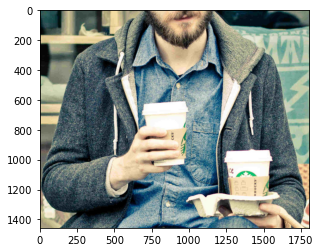

(1457, 1807, 3)


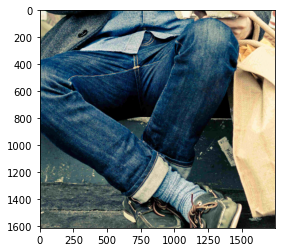

(1614, 1744, 3)


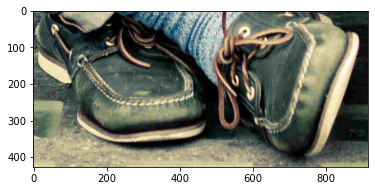

(427, 916, 3)
Time Taken: 8.273570775985718


In [24]:
plot_wears('D:/Appliedaicourse/Casestudy2/data/train/56adc0773264d741cfd8f2a6d22464ff.jpg')

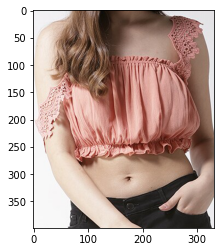

(399, 331, 3)


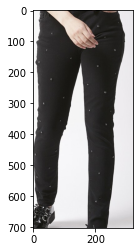

(703, 321, 3)


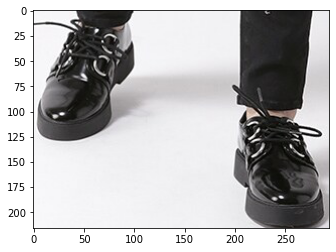

(216, 294, 3)
Time Taken: 6.144205093383789


In [25]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_jeans_jeggings///image29_3.jpg')

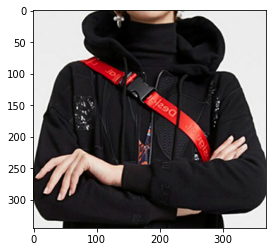

(345, 369, 3)


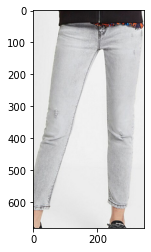

(681, 348, 3)


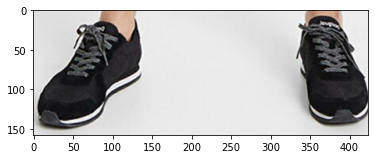

(158, 424, 3)
Time Taken: 5.556738615036011


In [26]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_jeans_jeggings///image33_3.jpg')

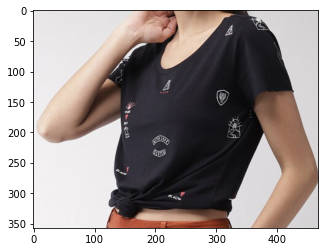

(357, 468, 3)


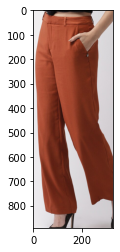

(891, 327, 3)


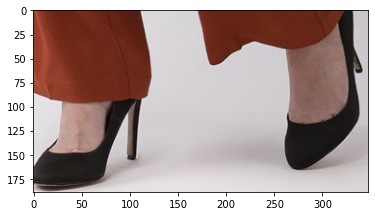

(189, 348, 3)
Time Taken: 6.082381248474121


In [27]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image0_3.jpg')

In [28]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image6_5.jpg')

Missing parts
Cant be Done
Time Taken: 5.840514421463013


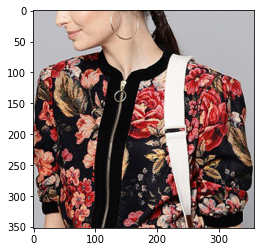

(352, 357, 3)


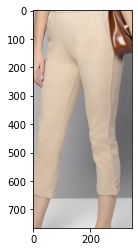

(765, 346, 3)


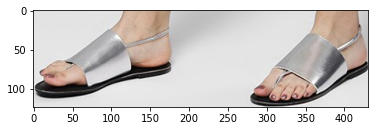

(124, 431, 3)
Time Taken: 6.263270616531372


In [29]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image16_3.jpg')

In [30]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image6_5.jpg')

Missing parts
Cant be Done
Time Taken: 5.137640953063965


In [31]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image189_3.jpg')

Missing parts
Cant be Done
Time Taken: 5.3308022022247314


In [32]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image56_5.jpg')

Missing parts
Cant be Done
Time Taken: 5.184351682662964


In [33]:
plot_wears('D://Appliedaicourse//Casestudy2//data/women_trousers//image59_4.jpg')

Missing parts
Cant be Done
Time Taken: 7.288229942321777
